# Introduction

### Problem statement
More than 1 million people are hospitalized with pneumonia each year, which is a very serious problem. Chest X-rays are currently the best method available for diagnosing it. The task is to classify if a person has pneumonia or not. Further, the classification model has to be deployed onto a mobile device for real time inference.

The following link contains information about the popular existing applications in medical dimain: https://www.grantsformedical.com/apps-for-medical-diagnosis.html

The above was especially useful during the times when COVID-19 was known to cause pneumonia.

The image below shows a visual comparison of a normal lung (left) and a lung affected by pneumonia (right).

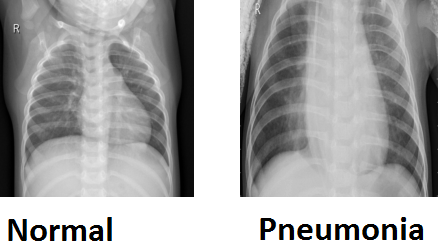

Observe that there is severe glass opacity in the image on the right  mainly due to air displacement by fluids.

### What is pneumonia?
Pneumonia is a lung infection that inflames the air sacs within the lungs. These air sacs, known as alveoli, can become filled with fluids or pus, hindering the efficient exchange of oxygen and carbon di-oxide. This can lead to a range of symptoms, including,
- Cough (often producing phlegm or pus).
- Fever or chills.
- Difficulty breathing.
- Chest pain.
- Fatigue.
- Confusion (particularly in older adults).

Various microorganisms, such as bacteria, viruses (like influenza or the virus that causes COVID-19) and fungi can cause pneumonia.

The severity of pneumonia can vary widely, from mild to life-threatening. Individuals at higher rist of severe illness include,
- Infants and young children.
- Adults aged 65 and older.
- People with weakened immune systems.
- Individuals with underlying health conditions such as chrinic lung diseases (asthma, CPOD), heart disease or diabetes.

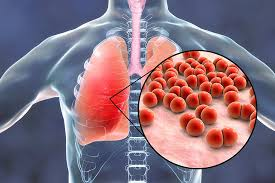

### Agenda and motivation
Computer Vision has a lot of applications in medical diagnosis. This document walks through the compelte pipeline from loading the data to predicting results. It also explains how to build an X-ray image classification model using CNN to predict whether an X-ray scan shows the presence of pneumonia.

### Real-time constraints
- Low latency requirements.
- False positive (type 1 error) or false negative (type 2 error) can be expensive.
- The model should ne confident in predicting the correct class.
- The model should be explainable through visualizations.

# How Will The Problem Be Solved?
Model like VGG-16, VGG-19, ResNets, etc, are state-of-the-art, but they are computationally expensive and cannot be deployed on mobile devices, where processing power and battery life are limited.

### Enter MobileNet
- MobileNet is a lightweight and efficient CNN architecture specifically designed for mobile and embedded devices.
- Key advantages:
    - High accuracy: Achieves competitive accuracy compared to larger models.
    - Small size: Significantly smaller model size (100x smaller in this case) translates to lower memory requirements and faster loading times.
    - Low latency: Enables real-time inference on mobile devices, crucial for applications like object detection in real-time.
- In summary, MobileNet is a suitable choice for this scenario due to its combination of high accuracy, small size and low latency. This makes it well suited for deployment on mobile devices, where computational resources are limited and real-time performance is essential.

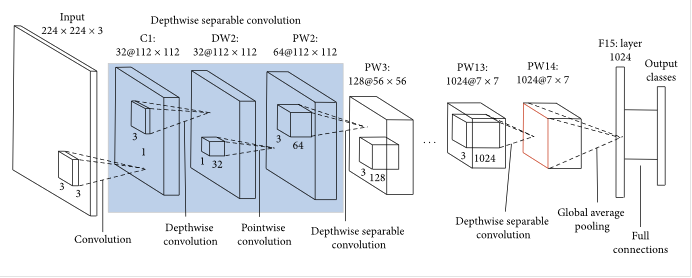

### TPUs
Apart from the above, TPUs will also be used.

TPUs (Tensor Processing Units) are Google's custom-designed application-specific integrated circuits (ASICs) specifically optimized for accelerating optimized for accelerating Machine Learning workloads. The following is a breakdown,
- Core function: TPUs excel at performing tensor operations, which are the fundamental building blocks of many Deep Learning algorithms.
- Key features:
    - High performance: Offer exceptional computational power, capable of delivering upto 180 teraflops of floating-point performance per chip.
    - High bandwidth memory: Equipped with 64 GB of high-bandwidth memory, enabling efficient data transfer and reducing bottlenecks.
    - Specialized architecture: Designed with a focus on matrix multiplication and other operations commonly found in Neural Networks.
- Availability:
    - Initially primarily available on Google Cloud, TPUs are now accessible through Google Colab, providing researchers and developers with a convenient way to leverage their power.

The following are the benefits of using TPUs,
- Significantly faster training times: TPUs can dramatically accelerate the training process for Deep Learning models, reducing the time required to develop and iterate on models.
- Improved scalability: TPUs can be easily scaled to handle large-scale training jobs, allowing for faster experimentation and model deployment.
- Reduced training costs: By accelerating training, TPUs can help reduce the overall cost of training Deep Learning models.

In [1]:
# importing dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings

In [2]:
pd.set_option("display.max_columns", None)
sns.set_theme(style = "whitegrid")
warnings.filterwarnings("ignore")

`tf.distribute.Strategy` is a TensorFlow API to distribute training across multiple GPUs, multiple machines or TPUs. Using this API, the existing models and training code can be distributed with minimal code changes.

In [3]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()
    print(f"Device: {tpu.master()}")
    strategy = tf.distribute.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()

print(f"Number of replicas = {strategy.num_replicas_in_sync}")

Number of replicas = 1


In [4]:
# the key configiration parameters that will be used are defined below
# in order to tun on TPU, this should be run on Google Colab with TPU runtime selected

AUTOTUNE = tf.data.AUTOTUNE

# specifying the training batch size
BATCH_SIZE = 32 * strategy.num_replicas_in_sync

# specifying the image size
IMAGE_SIZE = [224, 224]

# list containing class names, which will be used to index on the model output
# 0 = NORMAL, 1 = PNEUMONIA
CLASS_NAMES = ["NORMAL", "PNEUMONIA"]

`tf.data.AUTOTUNE` is a configuration option in the TensorFlow library that allows the `tf.data` API to automatically tune the performance of the data pipeline. The following is a breakdown of how it works,
- Performance model building: When a parameter is set to `AUTOTUNE`, the `tf.data` API starts building a performance model of the input pipeline. This model monitors how long each operation in the pipeline takes to execute.
- Optimization algorithm: Based on the performance model, `tf.data` employs an optimization algorithm to determine the optimal allocation of CPU resources across all operations specified as `AUTOTUNE`. This essentially involves finding the best balance between different operations to ensure efficient data processing.
- Continuous monitoring: While the data pipeline is running, `tf.data` keeps track of the time spent on each operation. This ongoing monitoring allows the optimization algorithm to adapt and refine resource allocation over time.

Benefits of using `tf.data.AUTOTUNE` are,
- Reduced manula tuning: By automating the optimization process, `tf.data.AUTOTUNE` eliminates the need for manual trial-and-error to find the best configuration for the data pipeline. This can save a significant time and effort.
- Improved performance: The optimization algorithm often leads to a more efficient data pipeline, resulting in faster data processing and potentially reduced training times for the ML models.
- Adaptability: `tf.data.AUTOTUNE` continuously monitors and adjusts resoruce allocation, enabling the data pipeline to adapt to changing hardware conditions or workload patterns.

# Dataset
The dataset is present in the TFRecord file format. TFRecord is a TensorFlow's proprietory binary storage format. It stores data as a sequence of binary strings, making it efficient for handling large datasets.

### Key advantages
- Space efficiency: Binary data generally occupies less disk space compared to text-based formats.
- Faster I/O: Reading binary data from disk is significantly faster than reading text data, leading to improved data loading performance.
- Optimized for TensorFlow: TFRecord is specifically designed to work seamlessly with TensorFlow's data input pipelines, enabling efficient data loading and processing.

### Benefits for large datasets
- Reduced storage costs: Smaller file sizes translate to lower storage costs, especially for massive datasets.
- Faster training: Efficient data loading and processing with TFRecord can significantly speed up the training process, reducing the time required to train complex models.
- Improved scalability: TFRecord can be effectively used with distributed training systems, enabling efficient data distribution across multiple machines.

In [5]:
# import ssl

# ssl._create_default_https_context = ssl._create_unverified_context

train_images = tf.data.TFRecordDataset("gs://download.tensorflow.org/data/ChestXRay2017/train/images.tfrec")
train_paths = tf.data.TFRecordDataset("gs://download.tensorflow.org/data/ChestXRay2017/train/paths.tfrec")

ds = tf.data.Dataset.zip((train_images, train_paths))

In [6]:
COUNT_NORMAL = len([filename for filename in train_paths if "NORMAL" in filename.numpy().decode("utf-8")])
print(f"Normal images count in training dataset = {str(COUNT_NORMAL)}")

COUNT_PNEUMONIA = len([filename for filename in train_paths if "PNEUMONIA" in filename.numpy().decode("utf-8")])
print(f"Normal images count in training dataset = {str(COUNT_PNEUMONIA)}")

print(f"Total count of images = {COUNT_NORMAL + COUNT_PNEUMONIA}")

2025-01-10 21:44:26.492854: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:370] TFRecordDataset `buffer_size` is unspecified, default to 262144
2025-01-10 21:44:26.502950: W external/local_tsl/tsl/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "NOT_FOUND: Could not locate the credentials file.". Retrieving token from GCE failed with "FAILED_PRECONDITION: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata.google.internal".
2025-01-10 21:44:28.178951: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Normal images count in training dataset = 1349
Normal images count in training dataset = 3883
Total count of images = 5232


2025-01-10 21:44:29.727325: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Observe that there are way more images that are classified as pneumonia then normal. This means that there is a class imbalance persent in the dataset, this by extension can result in the model being biased towards the majority class (pneumonia).

# Addressing The Problem Of Class Imbalance

### Can augmentation be applied here?
Data augmentation will not be useful because the X-ray scans are only taken in a specific orientatio and variations such as flips and rotations can not exist in real-time X-ray images.

The imbalance can be corrected using class weights.

In [7]:
TRAIN_IMG_COUNT = COUNT_NORMAL + COUNT_PNEUMONIA

# scaling by total/ 2 helps to keep the loss to a similar magnitude
# the sum of the weights of all examples stays the same

weight_for_0 = ((1/ COUNT_NORMAL) * (TRAIN_IMG_COUNT))/ 2.0
weight_for_1 = ((1/ COUNT_PNEUMONIA) * (TRAIN_IMG_COUNT))/ 2.0

class_weights = {0: weight_for_0, 1: weight_for_1}

print(f"Weight for class 0 = {round(weight_for_0, 2)}")
print(f"Weight for class 1 = {round(weight_for_1, 2)}")

Weight for class 0 = 1.94
Weight for class 1 = 0.67


The weight for class 0 (NORMAL) is a lot higher than the weight for class 1 (PNEUMONIA). Since there are less NORMAL images, each NORMAL image will be weighted more to balance the data as CNN, or any other model for that matter, works best when the training dataset is balanced.

# Creating A Pair Of Image-Label
Each filename is to be mapped to the corresponding image-label pair. The following methods defined, will help in doing that. Since there are 2 labels, the encoding is done such that, `1` or `True` indicates PNEUMONIA and `0` or `False` indicates NORMAL.

In [8]:
def get_label(file_path):
    # convert the path to a list of path components
    parts = tf.strings.split(file_path, "/")
    # the second to last is the class dictionary
    return parts[-2] == "PNEUMONIA"

def decode_img(img):
    # convert the compressed string to a 3D unit9 tensor
    img = tf.image.decode_jpeg(img, channels = 3)
    # resize the image to the desired size
    return tf.image.resize(img, IMAGE_SIZE)

def process_path(image, path):
    label = get_label(path)
    label = tf.cast(label, dtype = tf.int32)
    # load the raw data from the file as a string
    img = decode_img(image)
    return img, label

ds = ds.map(process_path, num_parallel_calls = AUTOTUNE)

# Splitting The Data Into Training And Training Datasets

In [9]:
ds = ds.shuffle(1000)
train_ds = ds.take(4300)
val_ds = ds.skip(4300)

In [10]:
# shape of image-label pair
for image, label in train_ds.take(1):
    print(f"Image shape = {image.numpy().shape}")

2025-01-10 21:44:45.255061: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 119 of 1000
2025-01-10 21:45:05.153820: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 455 of 1000
2025-01-10 21:45:25.331990: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 776 of 1000


Image shape = (224, 224, 3)


2025-01-10 21:45:38.043548: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


# Load And Format The Testing Data

In [11]:
test_images = tf.data.TFRecordDataset("gs://download.tensorflow.org/data/ChestXRay2017/test/images.tfrec")
test_paths = tf.data.TFRecordDataset("gs://download.tensorflow.org/data/ChestXRay2017/test/paths.tfrec")

COUNT_NORMAL = len([filename for filename in test_paths if "NORMAL" in filename.numpy().decode("utf-8")])
print(f"Normal images count in test set = {str(COUNT_NORMAL)}")

COUNT_PNEUMONIA = len([filename for filename in test_paths if "PNEUMONIA" in filename.numpy().decode("utf-8")])
print(f"Pneumonia images count in test set = {str(COUNT_PNEUMONIA)}")

2025-01-10 21:45:38.814508: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Normal images count in test set = 234
Pneumonia images count in test set = 390


In [12]:
test_ds = tf.data.Dataset.zip((test_images, test_paths))
test_ds = test_ds.map(process_path, num_parallel_calls = AUTOTUNE)
test_ds_batch = test_ds.batch(BATCH_SIZE)

# Visualizing The Dataset
Buffered prefetching is used so that the data can be yielded from the disk without having the I/O to get blocked. Note that large datasets should not be cached in the memory. It is done here because the dataset is not very large and will be trained on TPUs.

In [13]:
def prepare_for_training(ds, cache = True):
    # since the dataset is small, it is only loaded once and is kept in the memory
    # use .cache(filename) to cache the preprocessing work for datasets that do not fit in the memory
    ds = ds.cache()
    ds = ds.shuffle(buffer_size = 1000)
    ds = ds.batch(BATCH_SIZE)

    # .prefetch() fetches the dataset in batches in the background while the model is being trained
    ds = ds.prefetch(buffer_size = AUTOTUNE)

    return ds

In [14]:
# call the next batch iteration of the training data
train_ds_batch = prepare_for_training(train_ds)
val_ds_batch = prepare_for_training(val_ds)
image_batch, label_batch = next(iter(train_ds_batch))

2025-01-10 21:45:53.688491: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 119 of 1000
2025-01-10 21:46:14.267364: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 455 of 1000
2025-01-10 21:46:31.793372: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 681 of 1000
2025-01-10 21:46:44.493466: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-01-10 21:46:50.884493: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-01-10 21:47:04.357443: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:27: Filling up shuffle buffer (this may take a while): 203 of 1000
2025-01-10 21:47:18.107164: I tensorflow/core

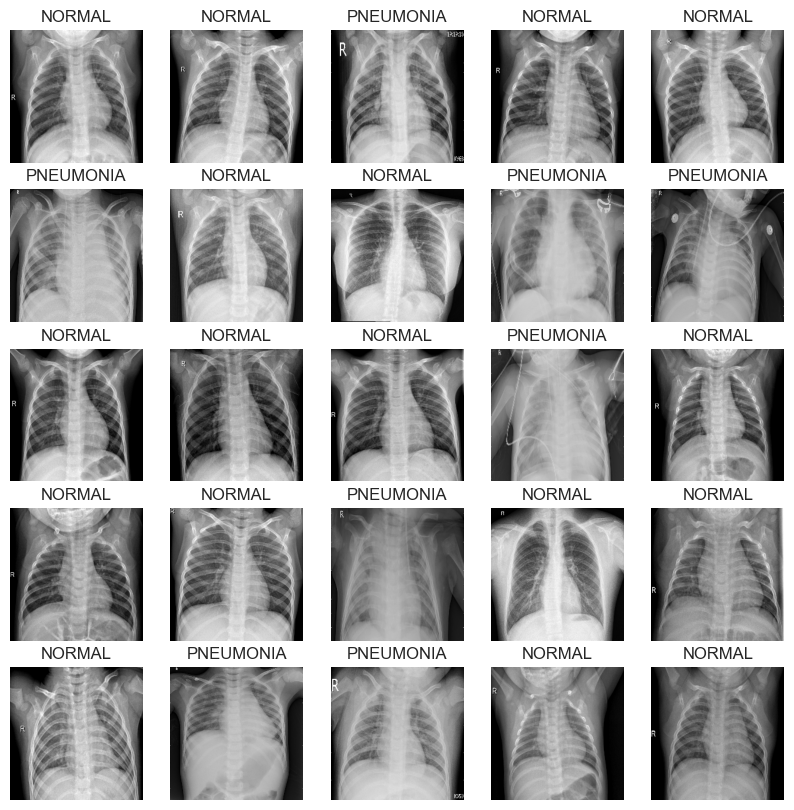

In [15]:
# method to show the images in the batch
def show_batch(image_batch, label_batch):
    plt.figure(figsize = (10, 10))
    for n in range(25):
        ax = plt.subplot(5, 5, n + 1)
        plt.imshow(image_batch[n]/ 255)
        if label_batch[n]:
            plt.title("PNEUMONIA")
        else:
            plt.title("NORMAL")
        plt.axis("off")

# the method takes in numpy arrays as its parameters
# therefore, numpy() method is called on the batches to return the tensor in numpy array form
show_batch(image_batch.numpy(), label_batch.numpy())

# MobileNet
While working with image datasets, some state-of-the-art models include AlexNet, VGG-16, ResNet-50, InceptionNet, etc. These model architectures acheive groundbreaking accuracies on ImageNet dataset but are computationally expensive to train and perform inference. This called for need of a lightweight but reliable model with less number of parameters. 

MobileNet is one such model. It was introduced in the year 2017 as a lightweight deep Neural Network. It has fewer parameters and high accuracy. The following is a comparison of MobileNet with other CNNs, 

| model_name | numberof_params | top_1_acc | top_5_acc |
| :-: | :-: | :-: | :-: |
| AlexNet | 62M | 63.3 | 84.6 |
| VGG16 | 138M | 74.4 | 91.9 |
| ResNet50 | 25.6M | 76 | 93 |
| Inception | 11.2M | 74.8 |92.2 |
| MobileNet | 2.3M | 71.0| 90.5 |

MobileNet has a top 5 accuracy of 90.5, which is rather very good given that it has only 2.5 million parameters. MobileNet is majorily used for on-device mobile inference. It uses TensorFlow Lite (TFLite). TFLite is a subset of TensorFlow and has only nessary function. This enables its usage on low resource devices (mobile, embedded, etc).

Further reading,
- https://arxiv.org/abs/1704.04861
- https://www.tensorflow.org/lite/guide

### Where is MobileNet used?
MobileNet with its lightweight architecture and high accuracy, finds widespread application across diverse domains. The following are some key areas where MobileNet is used,
1. Mobile and embedded vision:
    - On-device inference: MobileNet's compact size and efficiency make it ideal for performing Computer Vision tasks directly on mobile devices (smartphone, tablets) and ebedded systems (IoT devices). This eliminates the need for cloud connectivity, enabling real-time applications with low latency.
    - Object detection: MobileNet powers real-time object detection in mobile apps, such as,
        - Product recognition: Identifying products in images for shopping apps.
        - Visual search: Finding similar images based on visual content.
        - Augmented reality (AR): Enabling interactive AR experiences by recognizing objects in the real world.
    - Image classification: Accurately classifying images on mobile devices for tasks like,
        - Scene recognition: Identifying locations or environments.
        - Image sorting: Organizing photos based on content.
2. Health-care:
    - Mobile diagnostics: MobileNet can be integrated into mobile health applications for preliminary disgnoses. Examples include,
        - Skin cancer detection: Analyzing skin images for potential signs of melanoma.
        - Pneumonia detection: Analyzing chest X-rays for early detection of pneumonia.
        - Disease screening: Assisting in the initial screening of various disease based on medical images.
3. Internet-of-Things (IoT):
    - Smart cameras: Enabling real-time object detection and tracking in smart home security systems, traffic monitoring and industrial automation.
    - Drone applications: Powering object recognition and navigation for drones, enabling tasks like search and rescue, delivery and ariel surveillance.
4. Edge computing:
    - Resource-constrained devices: MobileNet's efficiency makes it suitable for deployment on edge devices with limited processing power and memory, such as edge servers and IoT gateways.

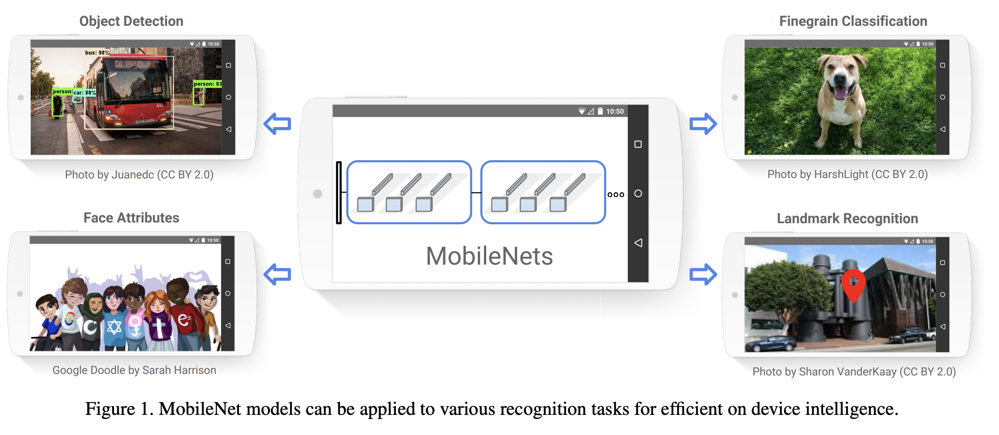

# MobileNet: Behind The Scenes
MobileNet core is backed by depthwise and pointwise convolutions which are computationally efficient and also produce significant results.

### Depthwise and pointwise convolutions
1. Standard convolution:
    - Traditional approach: In a standard convolution, a single filter (Kernel) is applied to all input channels simultaneously.
    - Example: For an RGB image (3 input channels), a single filter convolves with all 2 channels (red, green, blue) to produce a single output channel.
    - Key characteristic: This process allows the filter to mix information from different input channels to generate the output.
    - Computational cost: This approach can be computationally expensive, especially for images with many channels.
2. Depthwise separable convolution: MobileNet introduces a more efficient approach by decomposing the standard convolutions into 2 separate steps,
    - Depthwise convolutions:
        - Focus: This step operates on each input channel independently.
        - Mechanism: A separate filter is applied to each input channel.
            - For an RGB image, 3 separate filters (1 for each channel) are used.
            - Each filter convolves with its corresponding input channel, producing a separate feature map.
        - Key characteristic: This step does not mix information across channels. It extracts features within each individual channel.
        - Output: For an input image with 3 channels, the depthwise convolution produces 3 output channels, each representing the filtered output of the corresponding input channel.
    - Pointwise convolutions:
        - Purpose: This step combines the information extracted by the depthwise convolution across different channels.
        - Mechanism: `1x1` convolutional filters are applied to combine the output channels from the depthwise step.
            - These `1x1` convolutions act as linear combinations of the depthwise outputs.
        - Key characteristic: This step allows the network to learn complex features by effectively mixing the information extracted from the individual channels.
3. Benefits of depthwise separable convolutions:
    - Reduced computational cost:
        - Depthwise convolution significantly reduces the number of parameters compared to standard convolutions.
        - Pointwise convolution adds a small number of parameters, but the overall reduction is substantial.
    - Improved efficiency: This reduction in parameters leads to faster computations and lower memory requirements, making MobileNet suitable for resource-constrained devices.

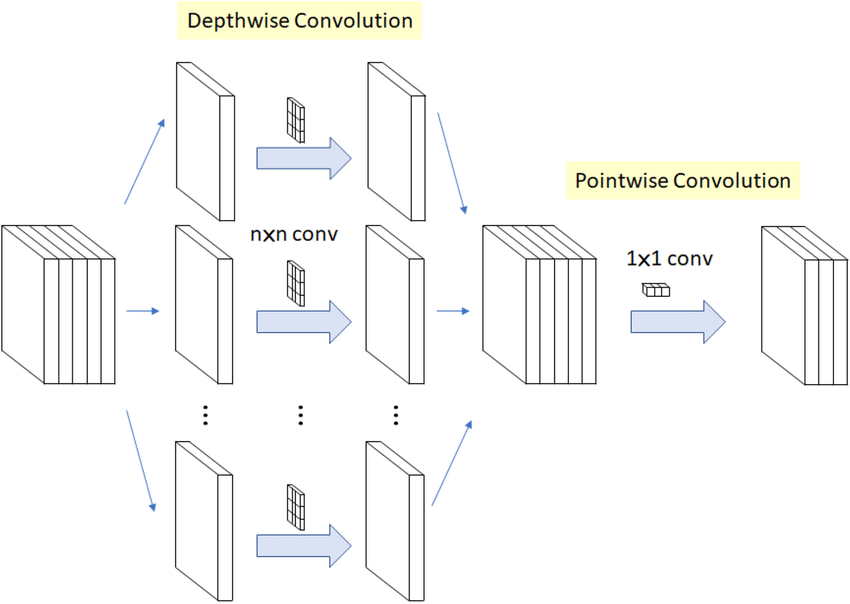

### Why does this lead to fewer parameters?
- Depthwise convolution: By processing each input channel independently, the number of parameters is significantly reduced.
- Pointwise convolution: While it introduces some additional parameters, the overall number if still much smaller than that of standard convolutions.

### How depthwise and pointwise convolutions help MobileNet achieve its efficiency?
1. Reduced computational cost:
    - Fewer parameters:
        - Standard convolutions require a large number of parameters, especially when dealing with images with multiple channels.
        - Depthwise separable convolutions significantly reduce the number of parameters,
            - Depthwise: Operates on each channel independently, leading to far fewer parameters compared to a single filter convolving with all channels.
            - Pointwise: While it adds some parameters, the overall increase is relatively small compared to the reduction achieved by depthwise convolution.
    - Reduced FLOPs(Floating-point operations):
        - Fewer parameters directly translate to a lower number of floating-point operations required dutin the forward and backward passes of the network.
        - This results in faster training and inference times, crucial for mobile and embedded devices.
2. Improved efficiency:
    - Smaller model size: Fewer parameters mean a smaller model size, which translates to,
        - Reduced storage space: Models can be stored more compactly, making them easier to download and deploy.
        - Faster loading times: Models load faster onto devices with limited memory.
    - Improved performance on resource-constrained devices:
        - MobileNet's reduced computational requirements allow it to run efficiently on devices with limited processing power and memory, such as smartphones, embedded systems and IoT devices.

# MobileNet Architecture And Versions

### Architecture

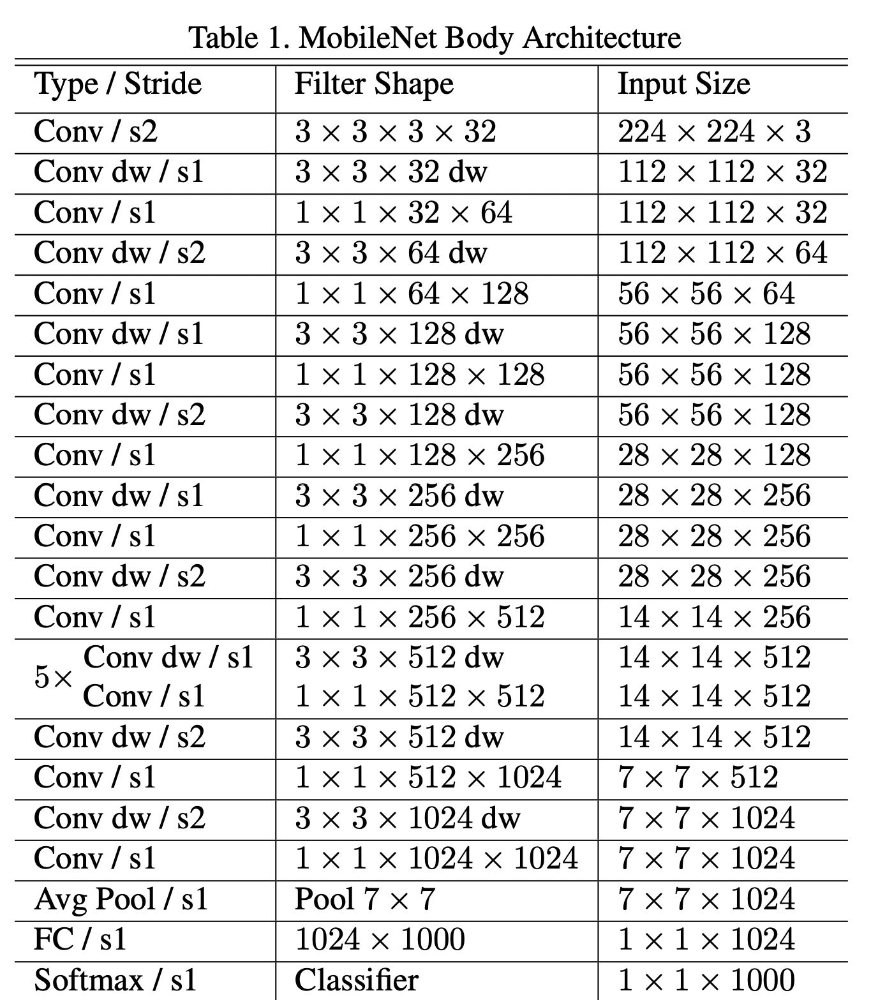

### Versions
MobileNet family of models represents a series of CNNs designed for efficient inference on mobile and embedded devices. The following are the key versions,
- MobileNet V1:
    - Introduced the concept of depthwise separable convolutions, which significantly reduce the number of parameters and computational cost compared to traditional convolutional networks.
    - Achieved a good balance between accuracy and efficiency.
- MobileNet V2:
    - Introduced the concept of inverted residuals with bottleneck structures.
    - These modifications improved accuracy while further reducing the number of parameters and computational cost.
    - Incorporated linear bottlenecks between the depthwise and pointwise convolutions, improving performance.
- MobileNet V3:
    - Employed platform-aware neural architecture search (PNAS) to find optimal network architectures for different hardware platforms.
    - Introduced efficient neural architecture search (ENAS) to further optimize the network structure.
    - Achieved state-of-the-art accuracy with even fewer parameters and computations.
- The following are the key improvements across versions:
    - Reduced model size: Each subsequent version has focused on reducing the model size and computational cost while maintaining or improving accuracy.
    - Improved accuracy: Despite their compact size, MobileNet models have consistently demonstrated competitive accuracy on various Computer Vision tasks.
    - Platform-aware design: MobileNet V3 incorporates platform-aware tenchinques to optimize the architecture for specific harware and software constraints.

# Architecture Using `tf.keras`

In [16]:
# method defining MobileNet block
def mobilenet_block(x, filters, strides):

    x = tf.keras.layers.DepthwiseConv2D(kernel_size = 3, strides = strides, padding = "same")(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(filters = filters, kernel_size = 1, strides = 1)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    return x

In [17]:
# stem of the model
input = tf.keras.Input(shape = (224, 224, 3))
x = tf.keras.layers.Conv2D(filters = 32, kernel_size = 3, strides = 2, padding = "same")(input)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.ReLU()(x)

In [18]:
# main part of the model
x = mobilenet_block(x, filters = 64, strides = 1)
x = mobilenet_block(x, filters = 128, strides = 2)
x = mobilenet_block(x, filters = 128, strides = 1)
x = mobilenet_block(x, filters = 256, strides = 2)
x = mobilenet_block(x, filters = 256, strides = 1)
x = mobilenet_block(x, filters = 512, strides = 2)
for _ in range(5):
    x = mobilenet_block(x, filters = 512, strides = 1)
x = mobilenet_block(x, filters = 1024, strides = 2)
x = mobilenet_block(x, filters = 1024, strides = 1)
x = tf.keras.layers.AvgPool2D(pool_size = 7, strides = 1, data_format = "channels_first")(x)
output = tf.keras.layers.Dense(units = 1000, activation = "softmax")(x)
model = tf.keras.Model(inputs = input, outputs = output)

In [19]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 112, 112, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d                │ (None, 112, 112, 32)   │           320 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_1              │ (None, 56, 56, 64)     │           640 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_2              │ (None, 56, 56, 128)    │         1,280 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 56, 56, 128)    │        16,512 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,258,808 (16.25 MB)

 Trainable params: 4,236,920 (16.16 MB)

 Non-trainable params: 21,888 (85.50 KB)

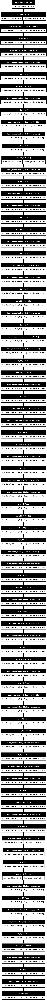

In [20]:
# plotting the model
tf.keras.utils.plot_model(model, to_file = "mobile_net.png", show_shapes = True, show_dtype = False, show_layer_names = True, rankdir = "TB", expand_nested = False, dpi = 96)

# Fine Tuning For Pneumonia X-Ray Images
1. Limitations of basic transfer learning:
    - Basic transfer learning: In this approach, the pre-trained MobileNet model is utilized, which has learned general features from ImageNet. Then,
        - The final classification layers of the MobileNet are removed.
        - A few new Fully Connected layers (typically 2 to 3) are added on top.
        - Only these newly added layers are trained on the pneumonia X-ray dataset.
    - Limitations:
        - Limited adaptability: The initial layers of MobileNet are designed to capture general features like edges, textures and basic shapes. However, these features might not be the most relevant for distinguishing subtle patterns in medical images like X-rays.
        - Dissimilarity between datasets: ImageNet and medical X-rays are vastly different domains. The features learned on ImageNet may not be directly applicable to the nuances of pneumonia patterns in X-ray images.
2. Fine-tuning for improved accuracy:
    - Unfreezing layers: To overcome the limitations of basic transfer learning, some of the higher-level Convolutional layers can be unfrozen within the MobileNet architecture. This means that during training, the weights of these unfrozen layers are allowed to be updated along with the weights of the newly added layers.
    - Benefits of fine-tuning:
        - Improved feature extraction: By allowing deeper layers to adapt, the model can learn more specific and relevant features for pneumonia detection in X-ray images.
        - Enhanced accuracy: Fine-tuning often leads to significant improvements in model accuracy compared to basic transfer learning, especially when dealing with challenging datasets.
3. Considerations for small datasets:
    - Overfitting risk: With a small dataset, fine-tuning can increase the risk of overfitting. Overfitting occurs when the model learns to perform exceptionally well on the training data but poorly on unseen data. This is because the model starts to memorize the training examples instead of learning generalizable patterns.
    - Mitigation strategies:
        - Data augmentation: Techniques like, image rotation, flipping, zooming and brightness adjustments can artifically increase the size of the training dataset.
        - Regularization: Techniques like dropout and L2 regularization can help prevent overfitting by introducing noise or penalizing large weights during training.
        - Careful layer selection: Unfreezing only a few higher-level layers initially and gradually increasing the number of unfrozen layers can help mitigate overfitting.

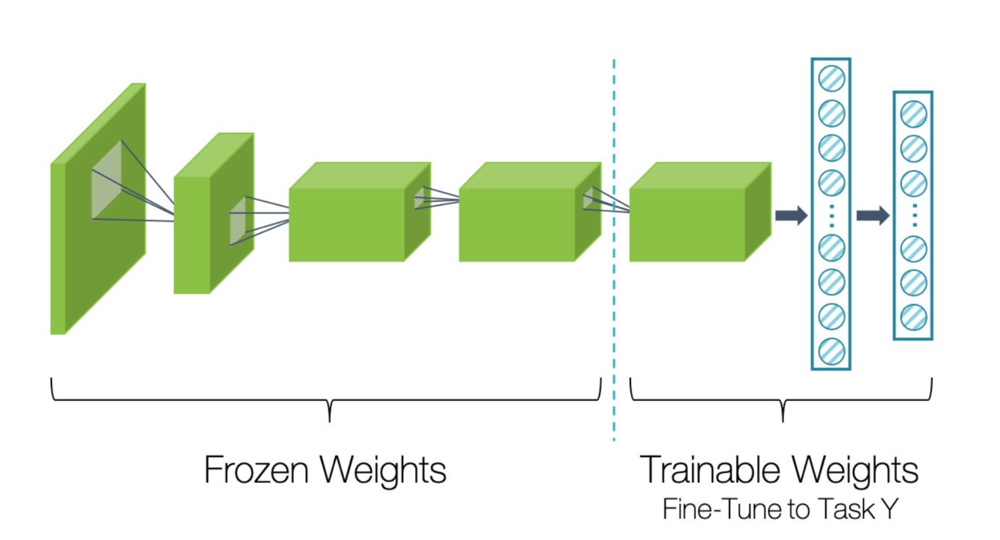

In [21]:
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

def build_model():

    mobilenet_model = tf.keras.applications.MobileNetV2(weights = "imagenet", include_top = False, input_shape = (224, 224, 3))

    for layer in mobilenet_model.layers[: -2]:
        layer.trainable = False

    # output of the base model
    x = mobilenet_model.output
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(128, activation = "relu")(x)
    output = tf.keras.layers.Dense(1, activation = "sigmoid")(x)
    pretrained_model = tf.keras.Model(inputs = mobilenet_model.input, outputs = output)

    return pretrained_model

finetuned_mobilenet = build_model()
finetuned_mobilenet.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 166,657 (651.00 KB)

 Non-trainable params: 2,255,424 (8.60 MB)

# Defining Callbacks
Callbacks are powerful tools in ML, especially Deep Learning, that allow to customize the training process. They are essentially function that are called at specific points during training, such as the beginneing of an epoch, the end of an epoch or after each batch. This gives a flexibility to monitor the training progess, adjust hyperparameters or even stop training early if necessary.

The following are 2 common and important callbacks,
1. Checkpoint callback: The primary goal of the checkpoint callback is to save the model's weights at specific intervals or based on certain conditions. This is crucual for several reasons,
    - Resuming training: If training is interrupted for any reason (e.g., power outage, system crash), the training can be resumed from the last saved checkpoint instead of starting from scratch.
    - Experiment tracking: The models can be saved ar different stages of training to compare their performance and analyze the training process.
    - Finding the best model: The checkpoint callback can be configured to save only the model with the best performance on a validation set. This ensures access to the model that achieved the highest accuracy or lowest loss during training.
2. Early stopping callback: 
    - Purpose: The early stopping callback is designed to prevent overfitting, a common problem in Deep Learning where the model starts to memorize the training data too well, leading to poor generalization on unseen data.
    - How it works: The callback monitors a specific metric (usually validation loss) during training. If this metric stops improving for a certain number of epochs (patience), the training process is automatically halted. This prevents the model from continuing to train and potentially overfitting.
    

In [22]:
# checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("x_ray_model.h5", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience = 3, restore_best_weights = True)

Learning rate should also be tuned. Too high of a learning rate will cause the model to diverge, too small of a learning rate will cause the model to be too slow.

Below is a method implementing the exponential learning rate scheduler.

In [23]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 ** (epoch/ s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.01, 20)

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(exponential_decay_fn)

In [24]:
initial_learning_rate = 0.01

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate, decay_steps = 100000, decay_rate = 0.96, staircase = True)

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(exponential_decay_fn)

# Model Training

In [25]:
with strategy.scope():
    finetuned_mobilenet = build_model()
    
    METRICS = [
        tf.keras.metrics.BinaryAccuracy(),
        tf.keras.metrics.Precision(name = "precision"),
        tf.keras.metrics.Recall(name = "recall")
    ]

    finetuned_mobilenet.compile(optimizer = tf.keras.optimizers.Adam(), loss = "binary_crossentropy", metrics = METRICS)

    # history = finetuned_mobilenet.fit(train_ds_batch, epochs = 10, validation_data = val_ds_batch, class_weight = class_weights, callbacks = [checkpoint_cb, early_stopping_cb, lr_scheduler])
    history = finetuned_mobilenet.fit(train_ds_batch, epochs = 10, validation_data = val_ds_batch, class_weight = class_weights, callbacks = [early_stopping_cb, lr_scheduler])

Epoch 1/10


2025-01-10 21:47:40.478204: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 119 of 1000
2025-01-10 21:47:53.912388: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 346 of 1000
2025-01-10 21:48:06.928908: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 567 of 1000
2025-01-10 21:48:27.662859: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-01-10 21:48:36.147364: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-01-10 21:48:43.233929: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:27: Filling up shuffle buffer (this may take a while): 93 of 1000
2025-01-10 21:48:56.286094: I tensorflow/core/

    135/Unknown 149s 346ms/step - binary_accuracy: 0.8272 - loss: 1.1596 - precision: 0.7957 - recall: 0.6965

2025-01-10 21:50:06.219414: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 119 of 1000
2025-01-10 21:50:21.092986: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 236 of 1000
2025-01-10 21:50:39.662246: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 455 of 1000
2025-01-10 21:50:53.769662: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 681 of 1000
2025-01-10 21:51:06.362911: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:9: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-01-10 21:51:12.589584: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-01-10 21:52:02.031756: I tensorflow/core/

135/135 ━━━━━━━━━━━━━━━━━━━━ 289s 1s/step - binary_accuracy: 0.8276 - loss: 1.1548 - precision: 0.7969 - recall: 0.6979 - val_binary_accuracy: 0.9828 - val_loss: 0.0603 - val_precision: 0.9828 - val_recall: 1.0000 - learning_rate: 0.0100
Epoch 2/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - binary_accuracy: 0.8666 - loss: 0.5742 - precision: 0.8555 - recall: 0.7952

2025-01-10 21:52:46.264276: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


135/135 ━━━━━━━━━━━━━━━━━━━━ 44s 323ms/step - binary_accuracy: 0.8669 - loss: 0.5725 - precision: 0.8563 - recall: 0.7959 - val_binary_accuracy: 0.9828 - val_loss: 0.0567 - val_precision: 0.9828 - val_recall: 1.0000 - learning_rate: 0.0089
Epoch 3/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 331ms/step - binary_accuracy: 0.8535 - loss: 0.4981 - precision: 0.8484 - recall: 0.8140 - val_binary_accuracy: 0.9828 - val_loss: 0.0502 - val_precision: 0.9828 - val_recall: 1.0000 - learning_rate: 0.0079
Epoch 4/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 332ms/step - binary_accuracy: 0.6916 - loss: 0.7812 - precision: 0.7213 - recall: 0.5136 - val_binary_accuracy: 0.9871 - val_loss: 0.0639 - val_precision: 0.9902 - val_recall: 0.9967 - learning_rate: 0.0071
Epoch 5/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 45s 337ms/step - binary_accuracy: 0.8413 - loss: 0.5870 - precision: 0.8340 - recall: 0.7751 - val_binary_accuracy: 0.9882 - val_loss: 0.3467 - val_precision: 0.9924 - val_recall: 0.9956 - learning_rate: 0.0063
Epoch 6

2025-01-10 21:55:47.701474: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


135/135 ━━━━━━━━━━━━━━━━━━━━ 47s 347ms/step - binary_accuracy: 0.8259 - loss: 0.4947 - precision: 0.7828 - recall: 0.8469 - val_binary_accuracy: 0.9882 - val_loss: 0.2721 - val_precision: 0.9913 - val_recall: 0.9967 - learning_rate: 0.0056


# Plotting Model's Performance

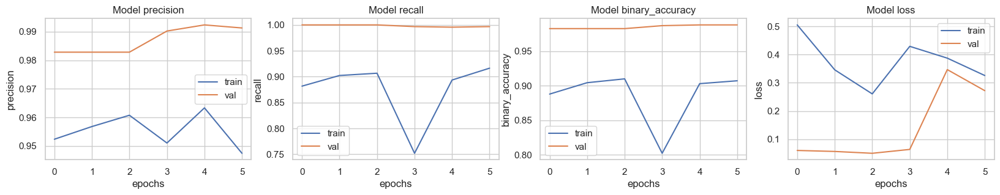

In [26]:
fig, ax = plt.subplots(1, 4, figsize = (20, 3))
ax = ax.ravel()

for i, metric in enumerate(["precision", "recall", "binary_accuracy", "loss"]):
    ax[i].plot(history.history[metric])
    ax[i].plot(history.history["val_" +metric])
    ax[i].set_title(f"Model {metric}")
    ax[i].set_xlabel("epochs")
    ax[i].set_ylabel(metric)
    ax[i].legend(["train", "val"])

# Loading The Model

In [27]:
# loaded_mobilenet = tf.keras.models.load_model('x_ray_model.h5')

# Model Evaluation

In [28]:
finetuned_mobilenet.evaluate(test_ds_batch, return_dict = True)

20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 397ms/step - binary_accuracy: 0.2984 - loss: 2.7559 - precision: 0.2984 - recall: 0.6667


{'binary_accuracy': 0.625,
 'loss': 1.450760841369629,
 'precision': 0.625,
 'recall': 1.0}

Observe that the accuracy on test data is lower than the accuracy on the validation data. This may indicated overfitting.

Refer this document to deal with overfitting: https://github.com/vidishsirdesai/dsml_end_to_end_reference/blob/main/computer_vision/02_overfitting_in_cnn.ipynb

The aim should be to increase precision.

# Predicting On The Test Images Using The Trained MobileNet Model

2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step
This image is [1.9295633]% NORMAL.
This image is [98.070435]% PNEUMONIA.
CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 μs
Wall time: 3.1 μs


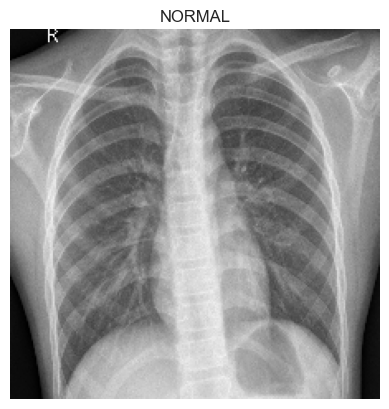

In [29]:
for image, label in test_ds_batch.take(2):
    plt.imshow(image[2]/ 255.0)
    plt.title(CLASS_NAMES[label[2].numpy()])
    plt.axis("off")

prediction = finetuned_mobilenet.predict(test_ds_batch.take(2))[2]
scores = [1 - prediction, prediction]

for score, name in zip(scores, CLASS_NAMES):
    print(f"This image is {(100 * score)}% {name}.")
%time

# Confusion Matrix

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━

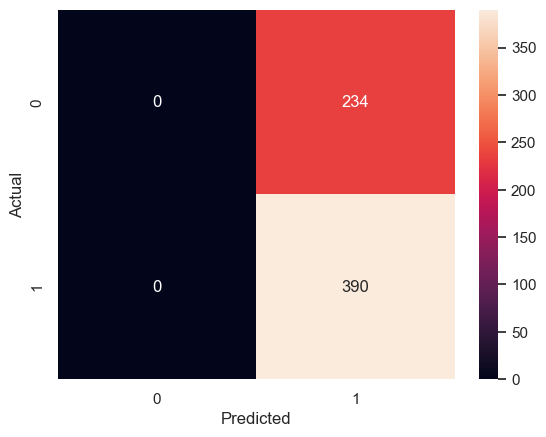

In [30]:
label_list = []
prediction_list = []

for image, label in test_ds:
    image = tf.expand_dims(image, axis = 0)
    label_bool = label > 0
    prediction = finetuned_mobilenet.predict(image)
    label = tf.where(label_bool, 1, 0)

    if prediction > 0.5:
        prediction = 1
    else:
        prediction = 0
    
    prediction_list.append(prediction)
    label_list.append(label)

test_confusion_matrix = tf.math.confusion_matrix(label_list, prediction_list)

ax = sns.heatmap(test_confusion_matrix, annot = True, fmt = "g")
ax.set(xlabel = "Predicted", ylabel = "Actual")
plt.show()

# How To Figure Out Which Part Of The Image Does The Model Focus On To Get A Prediction?
When humans classify images, they indistinctly direct their attention to specific regions. For instance, in distinguishing between cats and dogs, facial features are the focus. Similarly in medical imaging, like pneumonia diagnosis, experts scrutinize particualr areas of the X-ray.

To understand which regions a CNN considered crucial for its predictions, Grad-CAM (Gradient-weighted Class Activation Mapping) technique. Grad-CAM effectively highlights the areas within an image that most influence the CNNs decision for a specific class.

# Grad-CAM
Grad-CAM represents an advancement over the original Class Activation Mapping (CAM) method, offering increases flexibility and improved accuracy in visualizing which parts of an image a CNN focuses on to make a prediction. While the underlying concepts might be complex, the output of Grad-CAM is remarkably intuitive, providing a clear visual representation of the model's attention.

### Steps in the Grad-CAM algorithm
1. Input image: Begin with the image that has to be analyzed.
2. Model preparation:
    - Create a modified version of CNN model.
    - Crucually, this modified model is cut-off at the specific Convolutional layer for which the Grad-CAM heatmap was intended to be generated.
    - The original Fully Connected layers responsible for prediction are then re-attached to this truncated model.
3. Forward pass:
    - Feed the input image through this modified model.
    - Capture the output of the designated Convolutional layer.
    - Simultaneously, obtain the model's calculated loss (the difference between the predicted and actual class probabilities).
4. Gradient calculation:
    - Compute the gradient of the output from the chosen convolutional layer with respect to the calculated model loss. This gradient essentially indicated how sensitive the model's prediction is to changes in the activations of this layer.
5. Heatmap generation:
    - Extract the relevant portions of the calculated gradient that contribute most significantly to the prediction.
    - These gradient values are then used to weight the corresponding feature maps from the Convolutional layer.
    - The weighted feature maps are subsequently average and processed to created a heatmap.
    - Finally, this heatmap is resized and scaled to match the dimensions of the original input image, allowing for easy overlay and visualization.

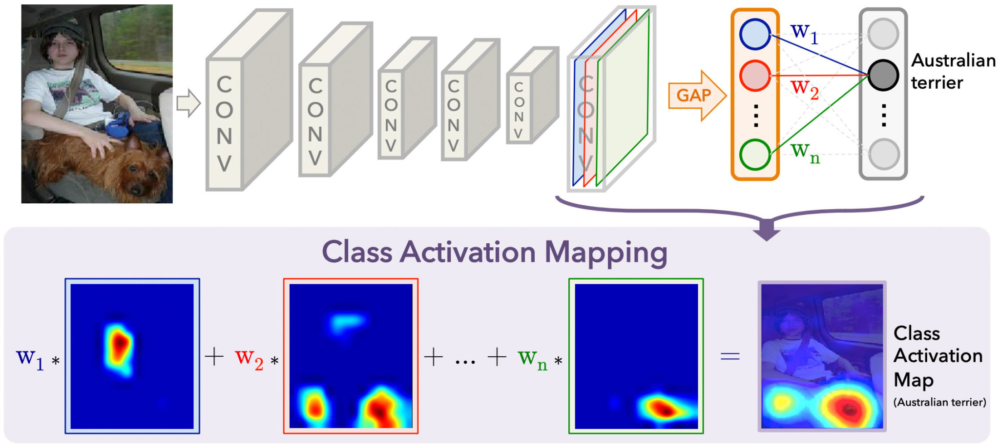

In [31]:
# the last Convolutional layer is needed for implementing Grad-CAM
# printing every Convolutional layer name in the MobileNet model
for i in range(len(finetuned_mobilenet.layers)):
    layer = finetuned_mobilenet.layers[i]
    if "conv" not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)

4 expanded_conv_depthwise (None, 112, 112, 32)
5 expanded_conv_depthwise_BN (None, 112, 112, 32)
6 expanded_conv_depthwise_relu (None, 112, 112, 32)
7 expanded_conv_project (None, 112, 112, 16)
8 expanded_conv_project_BN (None, 112, 112, 16)


In [32]:
# last Convolutional layer is "expanded_conv_project_BN"
last_conv_layer_name = finetuned_mobilenet.layers[8].name
last_conv_layer_name

'expanded_conv_project_BN'

Run the command `pip install tf-explain` in the terminal.

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 287ms/step
This image is [1.9295633]% NORMAL.
This image is [98.070435]% PNEUMONIA.


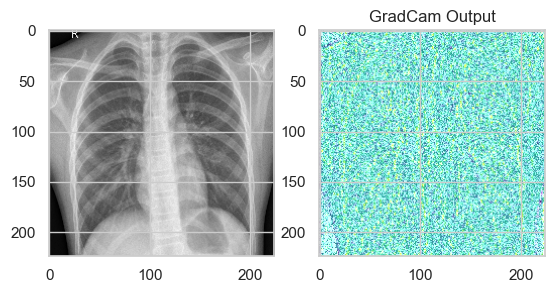

In [33]:
from tf_explain.core.grad_cam import GradCAM
import random

for image, label in test_ds_batch.take(2):
    data = ([image[2].numpy()], None)
    image = image[2]/ 255

prediction = finetuned_mobilenet.predict(test_ds_batch.take(2))[2]
scores = [1 - prediction, prediction]

for score, name in zip(scores, CLASS_NAMES):
    print(f"This image is {(100 * score)}% {name}.")

# start explainer
explainer = GradCAM()
grid = explainer.explain(data, finetuned_mobilenet, class_index = 0, layer_name = "expanded_conv_project_BN")

# subplot(r, c) provide the number of rows and columns
f, axarr = plt.subplots(1, 2)
axarr[0].imshow(image)
axarr[1].imshow(grid)
axarr[1].title.set_text("GradCam Output")
plt.show()

# Rethinking Model Design (Width, Depth, Resolution)

### Three dimensions of scaling
- Width scaling: This involves increasing the number of feature maps (channels) in each Convolutional layer. More channels allow the network to capture richer and more complex features from the input data. Imagine it as increasing the width of the information flow within each layer.
- Depth scaling: This refers to increasing the number of layers (depth) in the networl. Deeper networks can learn more intricate and abstract representations of the input data, enabling them to capture more complex patterns. Think of it as increasing the depth of the information processing pipeline.
- Resolution scaling: This involves adjusting the input image size. Higher resolution images provide more detailed information, which can be beneficial for tasks that require fine-grained details (e.g., object detection, image segmentation).

### Limitations of traditional scaling approaches
- independent scaling: Many traditional architectures, such as ResNet and MobileNet, primarily focus on scaling along a single dimension. For instance, ResNet variants (ResNet-50, ResNet-101, ResNet-152) primarily increase depth (number of layers).
- Suboptimal performance: Scaling a single dimension while keeping other fied can lead to suboptimal performance. For example, increasing the number of layers without considering the impact on the number of channels or input resolution might not always lead to significant improvements in accuracy.

### The need for a more holistic approach
- Interdependence of dimensions: The 3 scaling dimensions are not independent,
    - Increasing the input resolution requires the network to have a larger receptive field (the area of the input image that a neuron sees), which can be achieved by increasing the depth and potentially the width.
    - More channels are needed to capture the finer details present in higher-resolution images.
- Optimal scaling combinations: Finding the optimal combination of width, depth and resolution for a given task and computational budget is crucial for achieving the best performance.

### Analogy to hyperparameter tuning in Decision Trees
In Decision Trees, the following hyperparameters are tuned,
- Tree depth: Controls the complexity of the model. Deeper trees can capture more complex patterns but are more prone to overfitting.
- Minimum samples per leaf: Controls the minimum number of samples required to be at a leaf node. This helps prevent overfitting.
- Minimum samples per split: Controls the minimum number of samples required to split an internal node.

Similar to tuning these hyperparameters in Decision Trees, optimal combination of width, depth and resolution in CNN has to be found to achieve the best balance between accuracy and efficiency.

### Challenge of brute-force search
A brute-force search through all possible combinations of width, depth and resolution would be computationally extremely expensive and time-consuming. This makes it impractival to find the optimal scaling configuration through exhaustive search.

### EfficientNet
EfficientNet addresses these limitations by introducing a novel compount scaling method,
- Compount scaling: Instead of scaling each dimension independently, EfficientNet proposes a compound scaling method that scales all 3 dimensions (width, depth, resolution) in a principal way using a simple yet effective compount coefficient.

This approach recognizes the interdependence of these dimensions and allows for a more balanced and efficient scaling strategy.

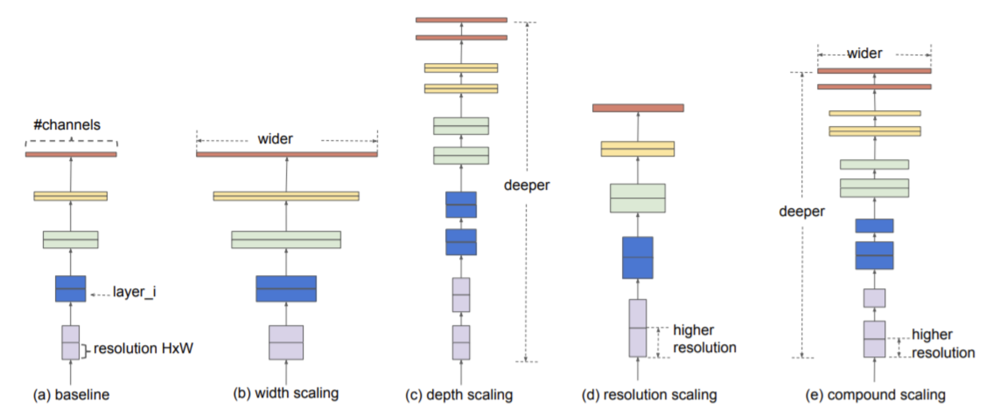

# EfficientNet
Paper: https://arxiv.org/abs/1905.11946

### The challenge of scaling in CNNs
- Traditional scaling limitations:
    - Previous architectures like ResNet primarily focused on scaling along a single dimension, such as increasing the depth (number of layers).
    - This independent scaling often led to suboptimal performance because the three scaling dimensions (width, depth, resolution) are inherently interconnected.
- Interdependence of dcaling dimensions:
    - Resolution and depth: If the input image resolution is increased, the network needs more layers to capture the information from the larger area. This is because deeper networks have larger receptive fields, allowing them to see a wider pottion of the input.
    - Resolution and width: Higher resolution images contain more fine-grained details. To effectively capture these details, the network requires more channels (width) to extract and represent the intricate features.

### EfficientNet: A novel approach
- Compound scaling: EfficientNet introduces a groundbreaking approach called "compound scaling". Instead of independently scaling width, depth and resolution, it utilzes a single compound coefficient ($\phi$) to control the scaling of all 3 dimensions simultaneously.
- Scaling rules:
    - EfficientNet defines a set of scaling rules that dictate how each dimension should be scaled relative to the compound coefficient ($\phi$).
    - These rules are carefully derived based on empirical observations and ensure a balanced and efficient scaling strategy.
- Example:
    - If the compount coefficient ($\phi$) is increased, the depth, width and resolution are scaled according to the defined rules. This ensures that all three dimensions are scaled proportionally, leading to a more harmonious and effective increase in model capacity.

### Benefits of EfficientNet
- Improved accuracy with fewer resources: EfficientNet models achieve state-of-the-art accuracy on various benchmarks while requiring significantly fewer parameters and FLOPs (Folating-poit Operations) compared to previous architectures like ResNet. This translates to,
    - Reduced computational cost: Lower resource requirements for training and inference.
    - Faster inference speeds: Models can be processed more quickly, making them suitable for real-time applications.
    - Smaller model sizes: Easier to deploy on resource-constrained devices (e.g., mobile phones, embedded systems).
- Flexibility: The compound coefficient ($\phi$) provides a simple and flexible mechanism to control the size and complexity of the model. This allows researchers and practitioners to easily adapt the model to different resource constraints and computational budgets.

### The EfficientNet family
- EfficientNet consists of a family of models (EfficientNet-B0 to EfficientNet-B7) with increasing size and complexity.
- Each model in the family is scaled using the compound coefficient, resulting in a series of models with varying performance and resource requirements.

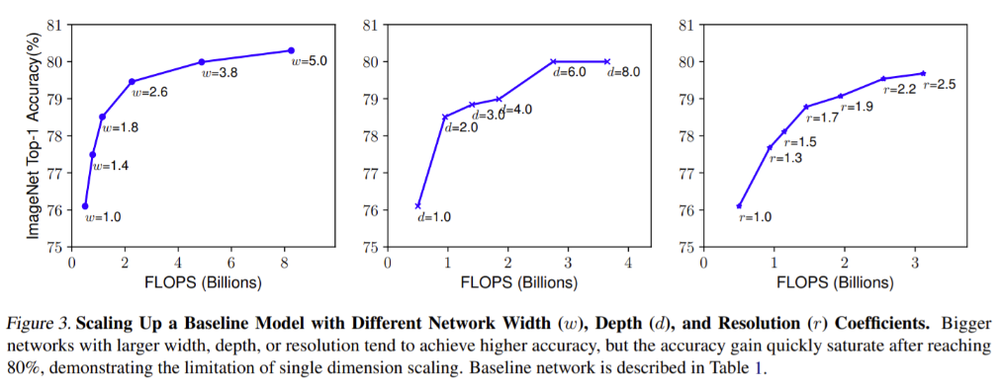

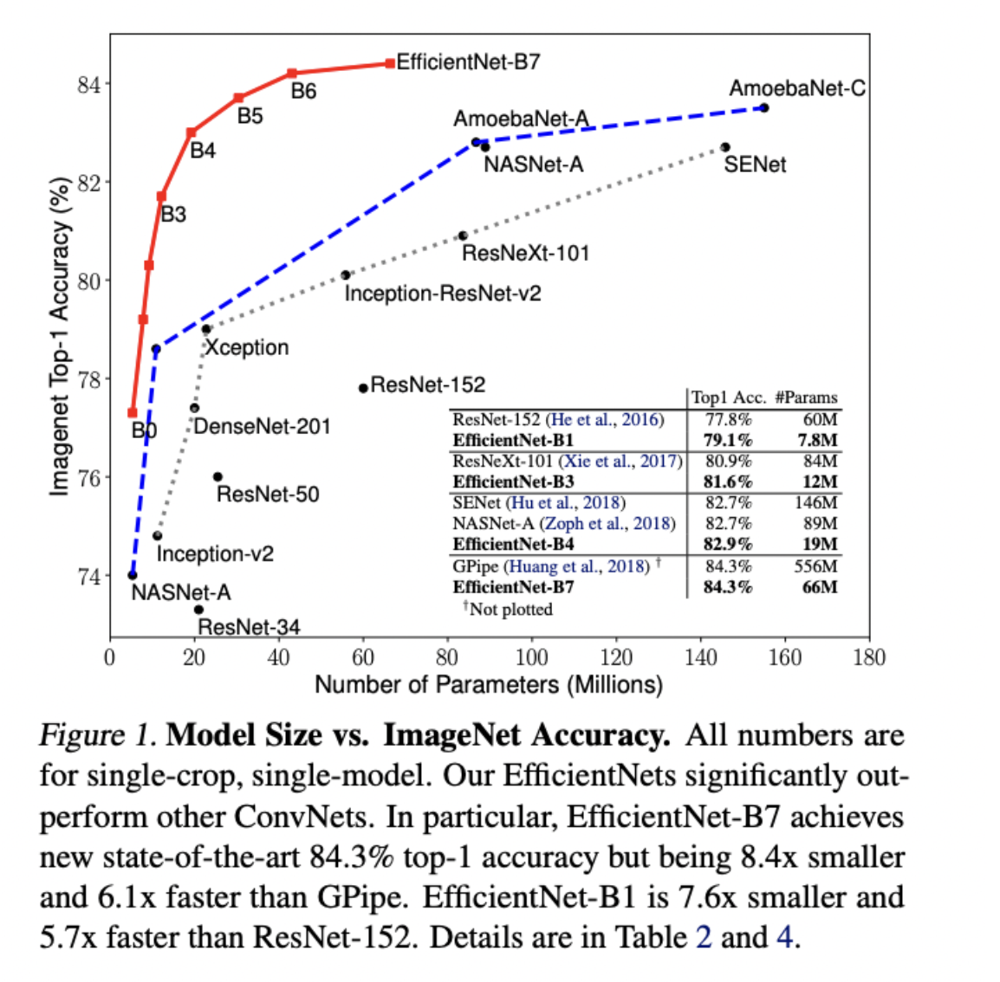

Scratch implementation of EfficientNet: https://github.com/qubvel/efficientnet/blob/f7f3e736c113b872caf53dae9fbbda996a8eb87d/efficientnet/model.py

The following table shows how EfficientNet compares to other CNN models,

| model_name | numberof_params | top_1_acc | top_5_acc |
| :-: | :-: | :-: | :-: |
| AlexNet | 62M | 63.3 | 84.6 |
| VGG16 | 138M | 74.4 | 91.9 |
| ResNet50 | 25.6M | 76 | 93 |
| Inception | 11.2M | 74.8 | 92.2 |
| MobileNet | 2.3M | 71.0 | 90.5 |
| EfficientNetB0 | 5.3M | 77.3 | 93.5 |

In [34]:
# loading pre-trained EfficientNet

with strategy.scope():
    pretrained_model = tf.keras.applications.EfficientNetB6(weights = "imagenet", include_top = False, input_shape = [*IMAGE_SIZE, 3])
    pretrained_model.trainable = True

    model = tf.keras.Sequential(
        [
            tf.keras.layers.Lambda(lambda data: tf.keras.applications.efficientnet.preprocess_input(tf.cast(data, tf.float32)), input_shape = [*IMAGE_SIZE, 3]),
            pretrained_model,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dense(2, activation = "softmax")
        ]
    )

# Beyond Convolution: The Transformer Architecture
1. Limitations of CNNs:
    - Computational cost: While CNNs are powerful, they can become computationally expensive, especially for very large images or deep networks.
    - Inductive biases: CNNs rely heavily on the inductive bias of local connectivity and translational invariance. This means they inherently assume that nearby pixels are more important than distant ones. While effective for many tasks, this assumption might not always be optimal, especially for long-range dependencies.
2. The Transformer architecture:
    - Attention mechanism: The core innovation of the Transformer is the attention mechanism. This mechanism allows the model to dynamically weigh the importance of different parts of the input sequence when processing each element. In essence, the model learns to focus on the most relevant parts of the input.
    - Positional encoding: Since the Transformer processes sequences, it is crucial to incorporate positional information. Positional encodings are added to the input sequence to provide information about the order of elements, allowing the model to understand the relative positions of different parts of the input.
    - Self-Attention: Transformers utilize a mechanism called Self-Attention, where each element in the input sequence attends to all other elements in the sequence. This allows the model to capture complex relationships and dependencies between different parts of the input.
3. Vision Transformers (ViT):
    - Adapting Transformers to images: ViT adapts the Transformer architecture to the domain of image processing.
    - Image patching: The first step in ViT is to divide the input image into a sequence of ono-overlapping patches. These patches act as the "words" of the image for the Transformer.
    - Linear projections: Each image patch is then projected into a vector representation, creating a sequence of vectors that can be processed by the Transformer.
    - Transformer encoder: The sequence of patch embeddings is then fed into a series of Transformer encoder layers, which utilize Self-Attention to capture relationships between different patches.
4. Advantages of ViT:
    - Strong performance: ViT models have demonstrated impressive performance on various image recognition benchmarks, often surpassing traditional CNN-based models.
    - Flexibility: The Transformer architecture is highly flexible and can be applied to various Computer Vision tasks beyond image classification, such as object detection, image segmentation and video analysis.
    - Potential for long-range dependencies: The Self-Attention mechanism is ViT allows the model to capture long-range dependencies within the image, which can be beneficial for tasks that require global context.

In [35]:
# patches = tf.image.extract_patches(
#         images=images,
#         sizes=[1, self.patch_size, self.patch_size, 1],
#         strides=[1, self.patch_size, self.patch_size, 1],
#         rates=[1, 1, 1, 1],
#         padding="VALID",
# )

# encoded = (tf.keras.layers.Dense(...)(patch) +
#                tf.keras.layers.Embedding(...)(position))


# x1 = tf.keras.layers.LayerNormalization()(encoded)
# #Just for sake of basic overview
# attention_output = tf.keras.layers.MultiHeadAttention(
#     num_heads=num_heads, key_dim=projection_dim, dropout=0.1
# )(x1, x1)



# # Skip connection 1.
# x2 = tf.keras.layers.Add()([attention_output, encoded])
# x3 = tf.keras.layers.LayerNormalization()(x2)# Layer normalization 2.



# # multilayer perceptron (mlp), a set of dense layers.
# x3 = mlp(x3, hidden_units=transformer_units,
#           dropout_rate=0.1)
# # Skip connection 2 forms input to next block
# encoded = tf.keras.layers.Add()([x3, x2])

# How To Decide Which Model Should Be Chosen On A New Dataset?
1. Dataset characteristics:
    - Size: If the dataset is too small, simpler models like VGGNet or MobileNetV2 might be more suitable to avoid overfitting. For larger datasets, more complex models like EfficientNet or ResNet can leverage the abundance of data.
    - Image size: The input image size can significantly impact model choice. If high-resolution images are being dealt with, models with larger receptive fields and deeper architectures might be necessary.
    - Task complexity: For complex tasks like object detection, image segmentation or video analysis, more sophisticated models like EfficientNet or Transformer-based architectures (like ViT) might be required.
2. Resource constriants:
    - Computational resources: If there are limited computational resources for training or inference, consider models with lower computational complexity, such as MobileNetV2 or EfficientNet-Lite.
    - Memory constraints: For deployment on devices with limited memory, models with smaller model sizes (fewer parameters) are crucial.
    - Power consumption: For battery-powered devices, energy-efficient models like MobileNetV2 are essential.
3. Performance requirements:
    - Accuracy: If achieving the highest possible accuracy is the primary goal, models like EfficientNet or larger ResNet variants might be preferred.
    - Speed: For real-time applications, models with faster inference speeds, such as the MobileNetV2 or light-weight EfficientNet variants, are crucial.
    - Latency: Low latency is critical for applications with strict real-time requirements.
4. Model interpretibility:
    - For some application, model interpretibility is important. Simpler models like VGGNet might be easier to interpret and explain than more complex models.
5. Model selection strategies:
    - Start with a baseline: Begin with a well-established baseline model, such as ResNet50 or MobileNetV2.
    - Experiment and iterate: Experiment with different model architectures, hyperparameter tuning and data augmentation techniques to improve performance.
    - Consider model ensembles: Ensembles of multiple models can often achieve higher accuracy than individual models.

# Things To Keep In Mind Before Applying Transfer Learning
1. Factors influencing Transfer Learning strategy:
    - Dataset size:
        - Small dataset:
            - Limited data: Training a deep network from scratch on a small dataset is highly prone to overfitting.
            - Transfer learning: Leveraging a pre-trained model can be highly beneficial.
                - Feature extraction: The pre-trained model can be used to extract features from the new dataset. Then, a simple classifier (e.g., SVM) can be trained on top of these extracted features. This minimizes overfitting and requires training only a small classifier.
                - Fine-tuning (limited): Fine-tune only the final layers of the pre-trained model, keeping the earlier layers frozen. This allows the model to adapt to the specific characteristics of the new dataset while preserving the valuable features learned on the large dataset.
        - Large dataset:
            - Fine-tuning: With a large dataset, there is more data to guide the model and reduce the risk of overfitting. Fine-tuning the entire network or a significant portion of it can lead to improved performance.
            - Training from scratch: While possible, training from scratch might be less efficient and may require more computational resources. However, it can be considered if the new dataset is significantly different from the original dataset.
    - Dataset similarity:
        - Similar dataset: If the new dataset is similar to the original dataset (e.g., both involve image classification of natural objects), the pre-trained model's features are likely to be highly relevant. This allows for more effective Transfer Learning.
        - Dissimilar dataset: If the dataset are very different (e.g., classifying medical images versus classifying natural images), the pre-trained model's features might not be as directly applicable. In such cases, fine-tuning might require more careful consideration and potentially more extensive training.
2. Additional considerations:
    - Computational resources: If computational resources are limited, feature extraction or fine-tuning only a portion of the network might be more practical.
    - Time constraints: Transfer Learning can often accelerate training time compared to training from scratch, which can be crucial in time-sensitive projects.
    - Domain expertise: The domain expertise can be leveraged to guide the Transfer Learning process and make informed decisions about which parts of the model to fine-tune.

# Further Reading
- DenseNet : https://arxiv.org/pdf/1608.06993.pdf
- SqueezeNet : https://arxiv.org/pdf/1602.07360.pdf
- NASNet : https://arxiv.org/pdf/1707.07012.pdf